# Barcode Detection

This Notebook implements a full hand-drawn barcode detection pipeline.

In [10]:
IMAGE_PATH = "./test_images/442442_242463_77563_432227_505824_418033.jpg"

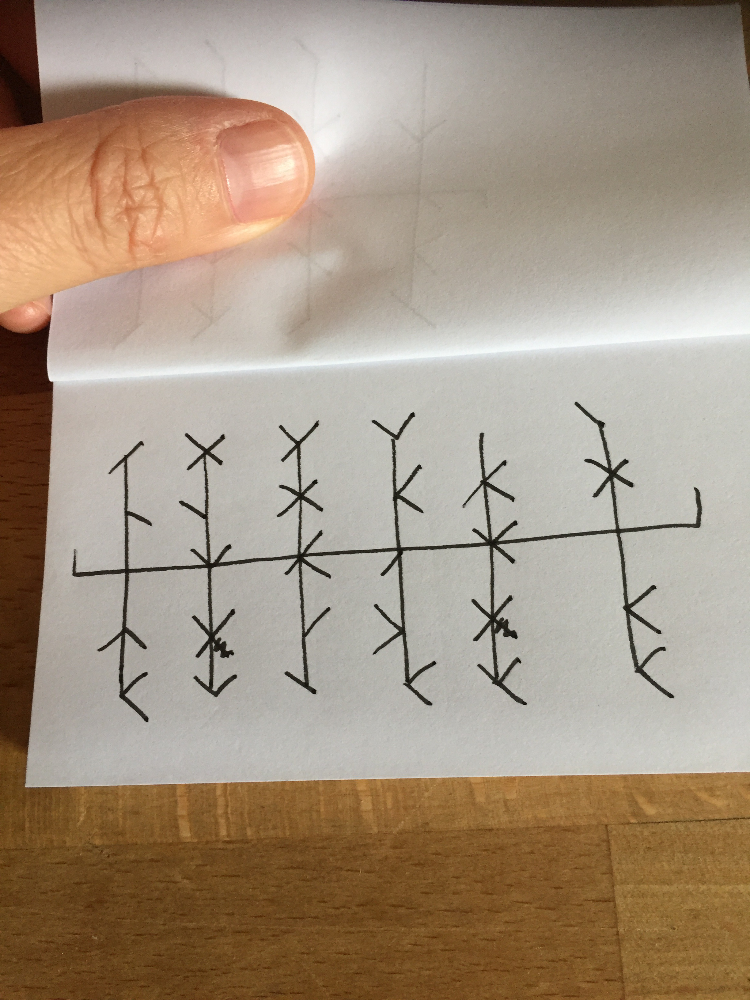

In [11]:
from PIL import Image 
  
#show the input image
im = Image.open(IMAGE_PATH)  
display(im)

## Import the Barcode Detection Model

In [4]:
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '2'    # Suppress TensorFlow logging (1)
import pathlib
import tensorflow as tf

#tf.get_logger().setLevel('ERROR')           # Suppress TensorFlow logging (2)

# Enable GPU dynamic memory allocation
gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus:
    tf.config.experimental.set_memory_growth(gpu, True)

In [3]:
from tensorflow.python.client import device_lib

device_lib.list_local_devices()

[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 9316351232691211759,
 name: "/device:XLA_CPU:0"
 device_type: "XLA_CPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 15635985649661459243
 physical_device_desc: "device: XLA_CPU device",
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 7046801664
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 2390617881306002493
 physical_device_desc: "device: 0, name: GeForce GTX 1070, pci bus id: 0000:01:00.0, compute capability: 6.1",
 name: "/device:XLA_GPU:0"
 device_type: "XLA_GPU"
 memory_limit: 17179869184
 locality {
 }
 incarnation: 14330981648184639799
 physical_device_desc: "device: XLA_GPU device"]

In [5]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

In [6]:
MODEL_NAME = "faster_rcnn_resnet50_v1_640x640_coco17_tpu-8"
PATH_TO_SAVED_MODEL = "./exported-models/{}/saved_model".format(MODEL_NAME)

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 18.655544757843018 seconds


## ShowDetected Parts


In [7]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline 

In [8]:
PATH_TO_LABELS = "./exported-models/{}/annotations/label_map.pbtxt".format(MODEL_NAME)
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

Running inference for ./test_images/442442_242463_77563_432227_505824_418033.jpg... 

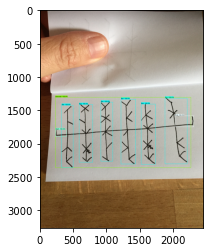

Done


In [12]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """    
    return np.array(Image.open(path))



print('Running inference for {}... '.format(IMAGE_PATH), end='')

image_np = load_image_into_numpy_array(IMAGE_PATH)

input_tensor = tf.convert_to_tensor(image_np)
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
               for key, value in detections.items()}
detections['num_detections'] = num_detections
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      line_thickness=4)

plt.imshow(image_np_with_detections)
plt.show()
print('Done')

## Import the Bar Categorization Model

In [13]:
print('Loading categorization model...', end='')
start_time = time.time()

cat_model = tf.keras.models.load_model('./exported-models/bar_cat_EfficientNetB2_9718')

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading categorization model...WARNING:tensorflow:Importing a function (__inference_block2c_activation_layer_call_and_return_conditional_losses_72147) with ops with custom gradients. Will likely fail if a gradient is requested.
Done! Took 48.03352093696594 seconds


## Get Bars

In [14]:
def crop(image, coords):
    cropped_image = image.crop(coords)
    cropped_image.show()

In [15]:
from math import atan2, degrees

In [16]:
def get_ordered_bars(image, detection_scores, detection_classes, detection_boxes, threshold):
    idx = 0
    while detection_scores[idx] > threshold:
        idx += 1
        
    if idx < 2:
        return
        
    classes = detection_classes[:idx]
    boxes = detection_boxes[:idx] # box coordinates are (ymin, xmin, ymax, xmax)
    
    bar_boxes = [b for i, b in enumerate(boxes) if classes[i] == 2]
    if len(bar_boxes) < 1:
        return
    
    try:
        start_idx = classes.tolist().index(3)   
        end_idx = classes.tolist().index(4) # make sure it also has an end
        # exact center points not needed for sorting or angle => optimized by not dividing the sum
        start_center = (boxes[start_idx][3] + boxes[start_idx][1], boxes[start_idx][2] + boxes[start_idx][0])  
        end_center = (boxes[end_idx][3] + boxes[end_idx][1], boxes[end_idx][2] + boxes[end_idx][0])        
        angle = degrees(atan2(end_center[1] - start_center[1], end_center[0] - start_center[0]))
        
        bars = [(b_box[3] + b_box[1], b_box[2] + b_box[0], b_box) for b_box in bar_boxes]
        
        # exact distance no needed => optimized by not using sqrt when sorting
        bars.sort(key = lambda p: (p[0] - start_center[0])**2 + (p[1] - start_center[1])**2) 
        
        bar_images = []
        for bar in bars:
            cropped = image.crop((bar[2][1] * image.size[0],
                                  bar[2][0] * image.size[1],
                                  bar[2][3] * image.size[0],
                                  bar[2][2] * image.size[1]))
            rotated = cropped.rotate(angle, Image.NEAREST, expand = True) 
            
            bar_images.append(rotated)
            
        return bar_images
            
    except ValueError:
        return

In [17]:
def get_bars(image_path):    
    image_np = load_image_into_numpy_array(image_path)

    input_tensor = tf.convert_to_tensor(image_np)
    input_tensor = input_tensor[tf.newaxis, ...]

    detections = detect_fn(input_tensor)

    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)
    
    ordered_bars = get_ordered_bars(Image.open(image_path), 
                                    detections['detection_scores'], 
                                    detections['detection_classes'], 
                                    detections['detection_boxes'],
                                    0.4)
    
    if ordered_bars is None:
        return
    
    return ordered_bars

In [18]:
bars = get_bars(IMAGE_PATH)

--------------------------------------------------
Bar 0:


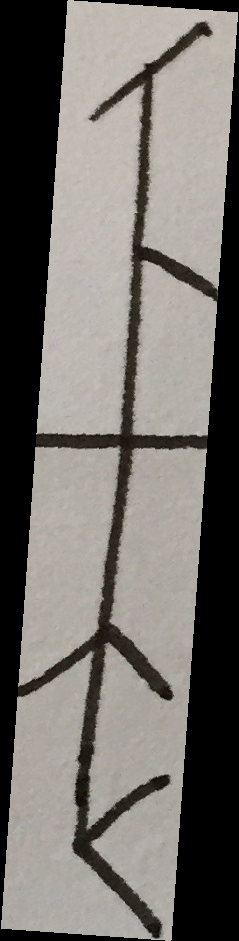

--------------------------------------------------
Bar 1:


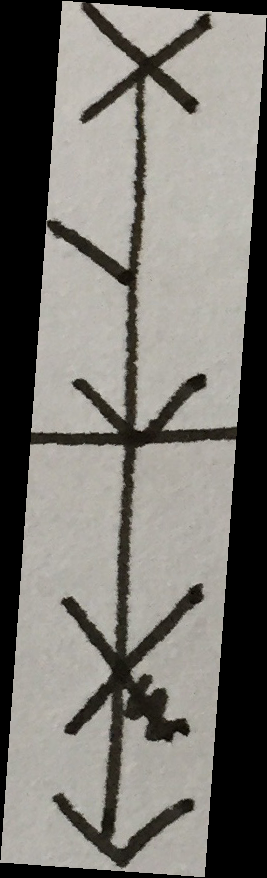

--------------------------------------------------
Bar 2:


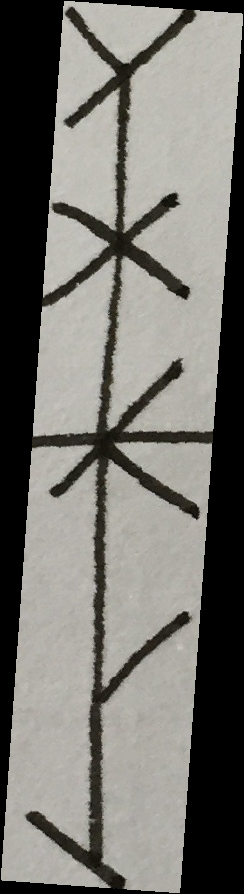

--------------------------------------------------
Bar 3:


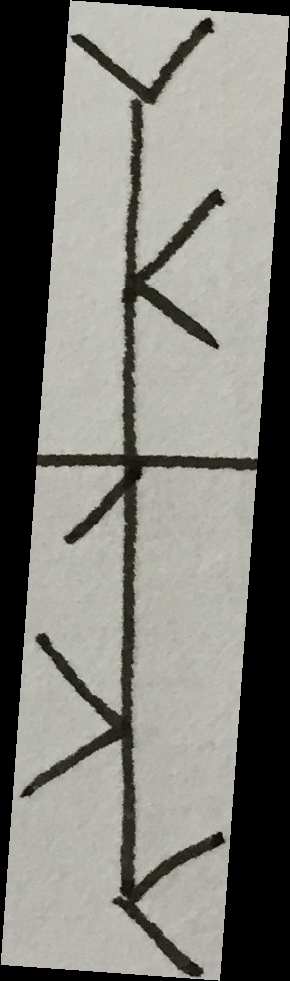

--------------------------------------------------
Bar 4:


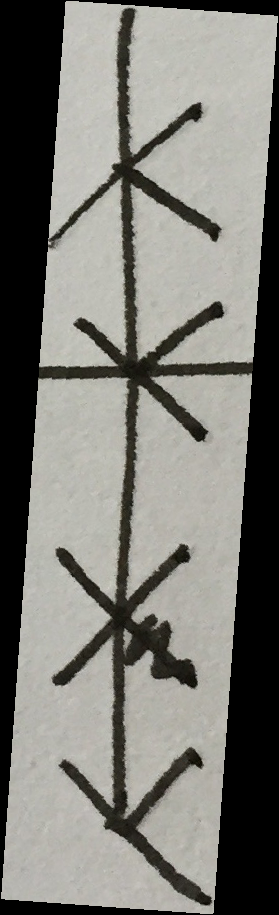

--------------------------------------------------
Bar 5:


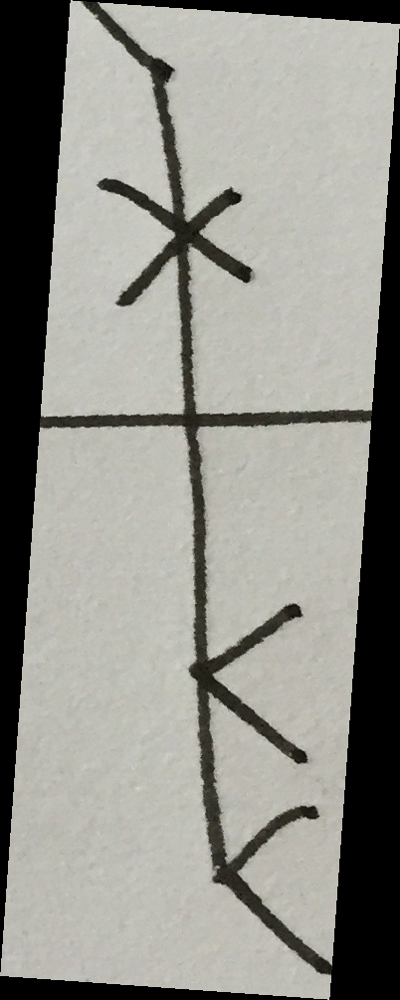

In [19]:
for idx, bar in enumerate(bars):
    print("-"*50)
    print("Bar " + str(idx) + ":")
    display(bar)

## Decode the bars

In [26]:
import keras
from keras.preprocessing import image

pred_y = []
for bar in bars:
    resized_bar = image.img_to_array(bar.resize((100, 450), Image.ANTIALIAS))
    bar_as_array = image.img_to_array(resized_bar)
    pred = cat_model.predict(bar_as_array.reshape((1, 450, 100, 3)))

    print(pred)
    #decode 
    index = 0
    decoded = 0
    for bit in (pred > 0.5).astype(int)[0]:
        decoded += bit << index
        index += 1

    print("DECODED:", decoded)
    pred_y.append(decoded)

[[5.5933329e-14 9.9999988e-01 1.2904934e-10 9.9996257e-01 2.0773204e-08
  1.3062486e-04 9.9999881e-01 9.8032409e-11 1.1303149e-06 1.5811701e-13
  9.8420134e-09 4.6068451e-09 1.5056844e-07 3.5829949e-08 1.0000000e+00
  1.0000000e+00 8.6100163e-06 9.9986601e-01 9.9997509e-01 4.2013037e-10]]
DECODED: 442442
[[9.9999833e-01 9.9999750e-01 1.0000000e+00 1.0000000e+00 9.9999714e-01
  2.6885896e-09 2.8039568e-07 2.6613716e-07 1.0000000e+00 1.0000000e+00
  7.1525697e-08 8.4767642e-08 1.0000000e+00 1.0000000e+00 2.7622559e-04
  9.9999988e-01 9.9999952e-01 1.0000000e+00 1.2618162e-14 4.1057286e-09]]
DECODED: 242463
[[1.0000000e+00 1.0000000e+00 8.7894163e-14 1.0000000e+00 1.0000000e+00
  1.0000000e+00 1.0000000e+00 1.0000000e+00 3.9305204e-09 9.9999940e-01
  9.9999988e-01 1.0000000e+00 6.4570955e-14 9.9999642e-01 6.1434385e-10
  1.0035188e-09 9.9999297e-01 1.1991794e-10 5.8467862e-11 8.3077953e-09]]
DECODED: 77563
[[1.0000000e+00 1.0000000e+00 4.6103847e-14 5.6458567e-09 2.0018366e-07
  1.0000000

In [27]:
pred_y

[442442, 242463, 77563, 432227, 505824, 418033]

In [28]:
IMAGE_PATH

'./test_images/442442_242463_77563_432227_505824_418033.jpg'

In [36]:
correct_decodings = IMAGE_PATH.split("/")[-1].split(".")[0].split("_")

for idx, correct_decoding in enumerate(correct_decodings):
    correct_decoding = int(correct_decoding)
    print("Bar1 : {:020b} ({:d}),\nPred : {:020b} ({:d}),\nError: {:020b}\n\n".format(
        correct_decoding, 
        correct_decoding, 
        pred_y[idx], 
        pred_y[idx], 
        correct_decoding ^ pred_y[idx]))

Bar1 : 01101100000001001010 (442442),
Pred : 01101100000001001010 (442442),
Error: 00000000000000000000


Bar1 : 00111011001100011111 (242463),
Pred : 00111011001100011111 (242463),
Error: 00000000000000000000


Bar1 : 00010010111011111011 (77563),
Pred : 00010010111011111011 (77563),
Error: 00000000000000000000


Bar1 : 01101001100001100011 (432227),
Pred : 01101001100001100011 (432227),
Error: 00000000000000000000


Bar1 : 01111011011111100000 (505824),
Pred : 01111011011111100000 (505824),
Error: 00000000000000000000


Bar1 : 01100110000011110001 (418033),
Pred : 01100110000011110001 (418033),
Error: 00000000000000000000


